In [1]:
import os
import tensorflow as tf
import numpy as np

In [2]:
# import dataset from directory
DIR_PATH = os.path.join('cleaned_data', 'night_dataset_all')
IMAGE_SIZE = 244
BATCH_SIZE = 32
# =============================
# Create Image Dataset form Directory
# =============================
ds_train = tf.keras.preprocessing.image_dataset_from_directory(
    DIR_PATH,
    labels='inferred',
    label_mode='int',
    color_mode='rgb',
    batch_size=32,
    image_size=(IMAGE_SIZE, IMAGE_SIZE),
    shuffle=True,
    seed=123,
    validation_split=0.1,
    subset='training'

)
ds_val = tf.keras.preprocessing.image_dataset_from_directory(
    DIR_PATH,
    labels='inferred',
    label_mode='int',
    color_mode='rgb',
    batch_size=32,
    image_size=(IMAGE_SIZE, IMAGE_SIZE),
    shuffle=True,
    seed=123,
    validation_split=0.1,
    subset='validation'
)

Found 1304 files belonging to 2 classes.
Using 1174 files for training.
Metal device set to: Apple M1 Max


2022-12-04 20:12:52.277521: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2022-12-04 20:12:52.277665: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


Found 1304 files belonging to 2 classes.
Using 130 files for validation.


2022-12-04 20:12:58.914885: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz


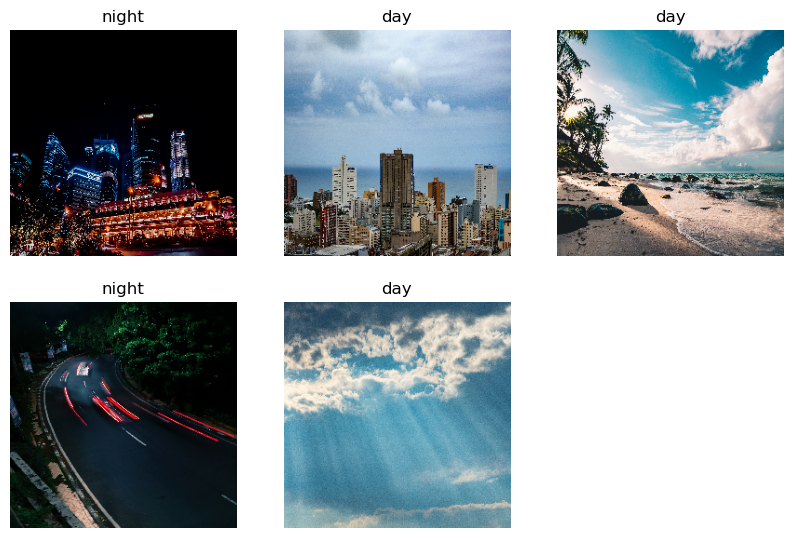

In [3]:
# Visualize data
images = None
labels = None
class_names = ds_train.class_names
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 10))
for images, labels in ds_train.take(1):
    for i in range(5):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")

In [4]:
# data augmentation
with tf.device('/CPU:0'): # for Apple Silicon which does not yet support random() with GPU
    augmentation = tf.keras.Sequential([
        tf.keras.layers.experimental.preprocessing.RandomContrast((0.4, 0.6)),
        tf.keras.layers.experimental.preprocessing.RandomFlip(mode="horizontal"),
        tf.keras.layers.experimental.preprocessing.RandomRotation(factor=(-0.05, 0.05)),
        tf.keras.layers.experimental.preprocessing.RandomZoom(height_factor=(0, -0.2),
                                                              width_factor=(0, -0.2)),
    ])

In [5]:
AUTOTUNE = tf.data.AUTOTUNE

augmented_ds_train = ds_train.map(
    lambda x, y: (augmentation(x, training=True), y),
    num_parallel_calls=AUTOTUNE
)

augmented_ds_train = augmented_ds_train.cache()
augmented_ds_train = augmented_ds_train.prefetch(buffer_size=10)

In [6]:
rescaling = tf.keras.Sequential([
    # rescaling
    tf.keras.layers.experimental.preprocessing.Rescaling(1./255)
])

In [7]:
model = tf.keras.models.Sequential(
    [
        rescaling,
        tf.keras.layers.Conv2D(128, (3, 3), activation='relu',
                               kernel_regularizer=tf.keras.regularizers.l2(0.01)),
        # tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D((2, 2)),

        tf.keras.layers.Conv2D(512, (3, 3), activation='relu',
                               kernel_regularizer=tf.keras.regularizers.l2(0.01)),
        # tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D((2, 2)),

        tf.keras.layers.GlobalAveragePooling2D(),
        tf.keras.layers.Dropout(0.2),
        tf.keras.layers.Dense(128, activation="relu"),
        tf.keras.layers.Dense(64, activation="relu"),
        tf.keras.layers.Dense(2, activation='softmax')
    ]
)

In [8]:
model.build(input_shape=(None, IMAGE_SIZE, IMAGE_SIZE, 3))
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_1 (Sequential)   (None, 244, 244, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 242, 242, 128)     3584      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 121, 121, 128)    0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 119, 119, 512)     590336    
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 59, 59, 512)      0         
 2D)                                                             
                                                                 
 global_average_pooling2d (G  (None, 512)             

In [9]:
model.compile(optimizer="adam",
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [10]:
history = model.fit(augmented_ds_train, epochs=20, validation_data=ds_val)

Epoch 1/20


/Users/allynbao/miniconda3/envs/tensorflow_2.9/lib/python3.9/site-packages/tensorflow/python/util/dispatch.py:1082: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a sigmoid or softmax activation and thus does not represent logits. Was this intended?"
  return dispatch_target(*args, **kwargs)
2022-12-04 20:18:31.476086: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


37/37 [==============================] - ETA: 0s - loss: 1.1334 - accuracy: 0.7436

2022-12-04 20:19:12.089357: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


37/37 [==============================] - 46s 874ms/step - loss: 1.1334 - accuracy: 0.7436 - val_loss: 0.3733 - val_accuracy: 0.9154
Epoch 2/20
37/37 [==============================] - 17s 461ms/step - loss: 0.3091 - accuracy: 0.9225 - val_loss: 0.2420 - val_accuracy: 0.9231
Epoch 3/20
37/37 [==============================] - 17s 450ms/step - loss: 0.2237 - accuracy: 0.9395 - val_loss: 0.2048 - val_accuracy: 0.9231
Epoch 4/20
37/37 [==============================] - 17s 466ms/step - loss: 0.2031 - accuracy: 0.9438 - val_loss: 0.1885 - val_accuracy: 0.9308
Epoch 5/20
37/37 [==============================] - 17s 449ms/step - loss: 0.1941 - accuracy: 0.9404 - val_loss: 0.1894 - val_accuracy: 0.9308
Epoch 6/20
37/37 [==============================] - 17s 464ms/step - loss: 0.1840 - accuracy: 0.9438 - val_loss: 0.1832 - val_accuracy: 0.9308
Epoch 7/20
37/37 [==============================] - 16s 440ms/step - loss: 0.1795 - accuracy: 0.9412 - val_loss: 0.1818 - val_accuracy: 0.9385
Epoch 8/20

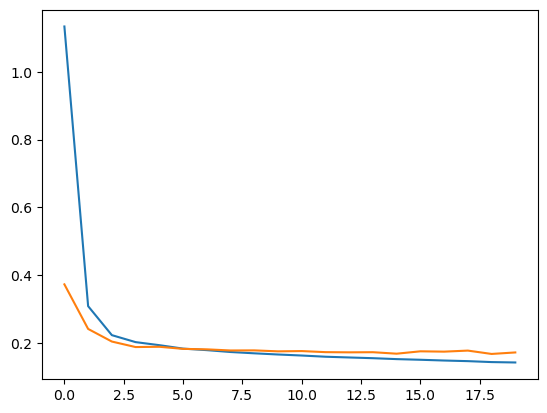

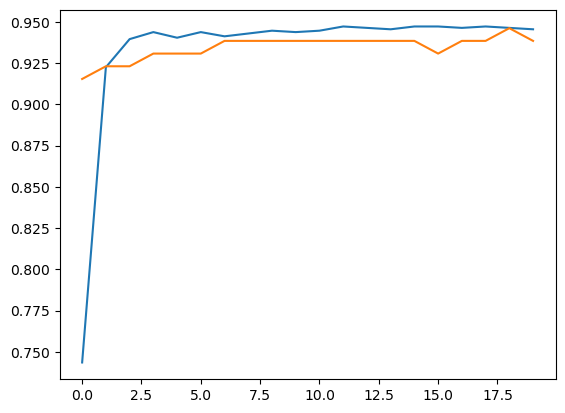

In [11]:
train_loss = history.history['loss']
train_acc = history.history['accuracy']

val_loss = history.history['val_loss']
val_acc = history.history['val_accuracy']

plt.plot(train_loss)
plt.plot(val_loss)
plt.show()
plt.plot(train_acc)
plt.plot(val_acc)
plt.show()

In [17]:
model.save(os.path.join("models", "night_recognition_basic_v1.h5"))

In [12]:
class_names

['day', 'night']

In [14]:
# test sample images:
import os
import numpy as np
import matplotlib.pyplot as plt
SAMPLE_DIR = os.path.join('sample_images', 'night testing')

ds_testing = tf.keras.preprocessing.image_dataset_from_directory(
    SAMPLE_DIR,
    label_mode=None,
    color_mode='rgb',
    batch_size=32,
    image_size=(IMAGE_SIZE, IMAGE_SIZE),
    shuffle=True,
    seed=123,
    validation_split=None
)

Found 46 files belonging to 1 classes.


In [15]:
def get_prediction(prediction, _class_names):
    one_hot_array = prediction[0]
    max_confidence = max(one_hot_array)
    if max_confidence < 0.5:
        return 'unsure'
    else:
        return _class_names[one_hot_array.argmax()]

1/1 [==============================] - 0s 214ms/step


2022-12-04 20:32:47.252499: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


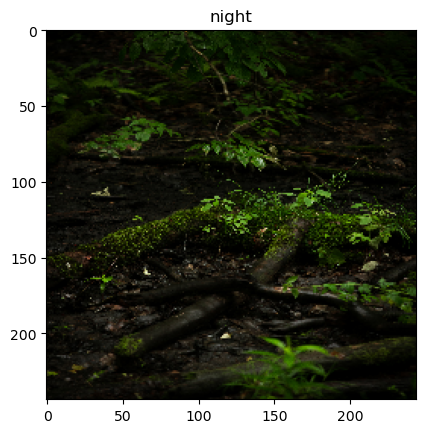

1/1 [==============================] - 0s 9ms/step


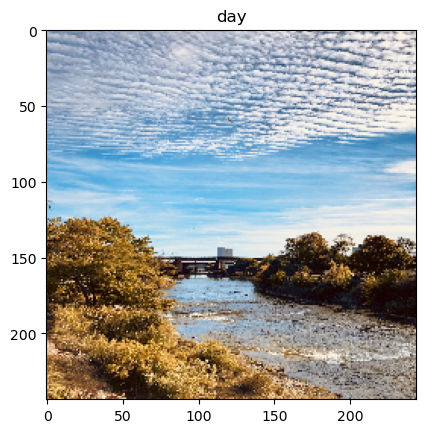

1/1 [==============================] - 0s 9ms/step


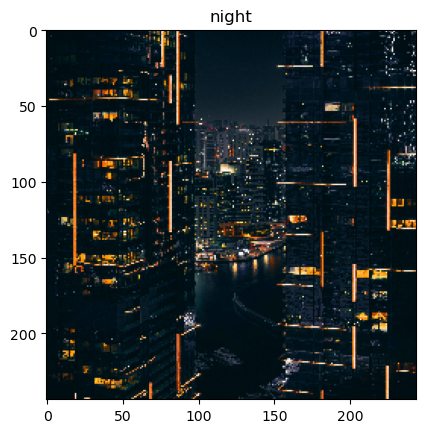

1/1 [==============================] - 0s 9ms/step


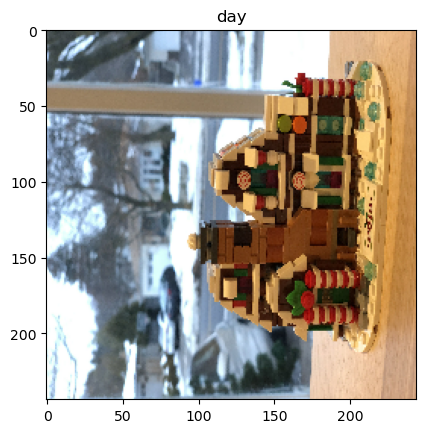

1/1 [==============================] - 0s 9ms/step


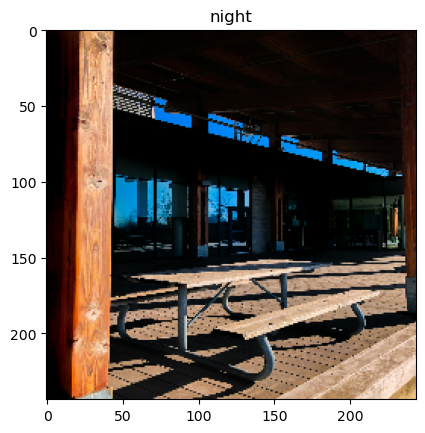

1/1 [==============================] - 0s 9ms/step


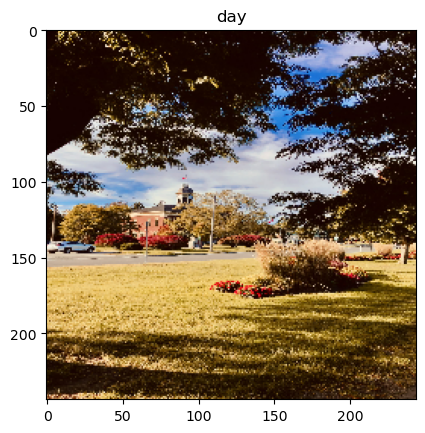

1/1 [==============================] - 0s 10ms/step


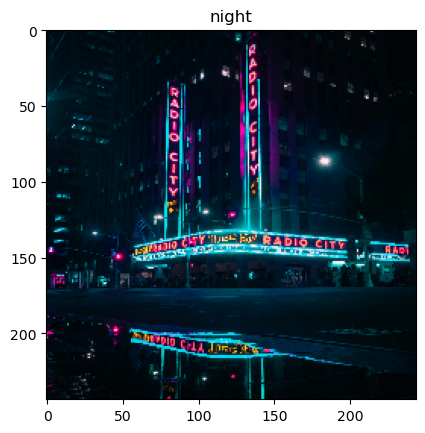

1/1 [==============================] - 0s 9ms/step


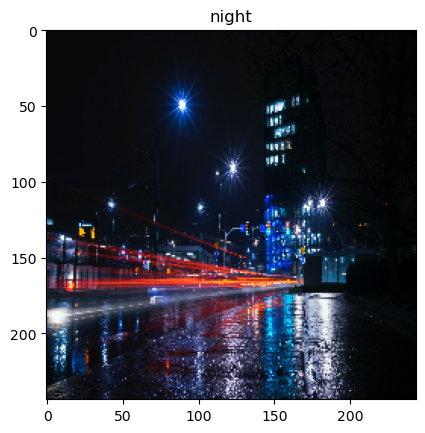

1/1 [==============================] - 0s 9ms/step


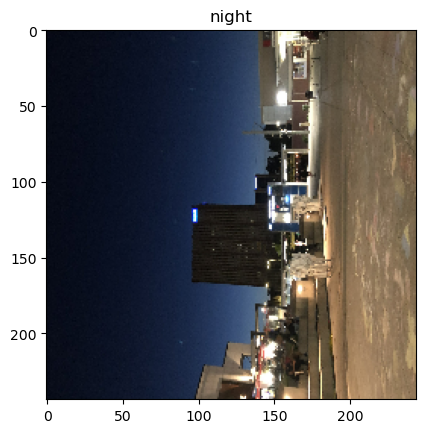

1/1 [==============================] - 0s 10ms/step


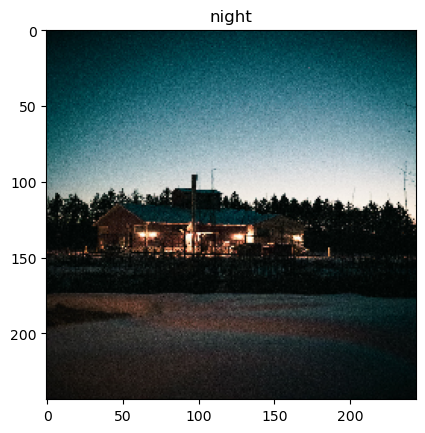

1/1 [==============================] - 0s 10ms/step


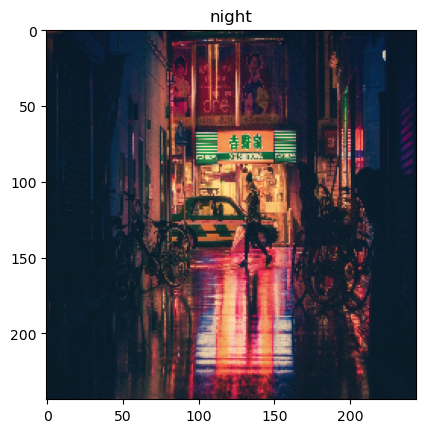

1/1 [==============================] - 0s 9ms/step


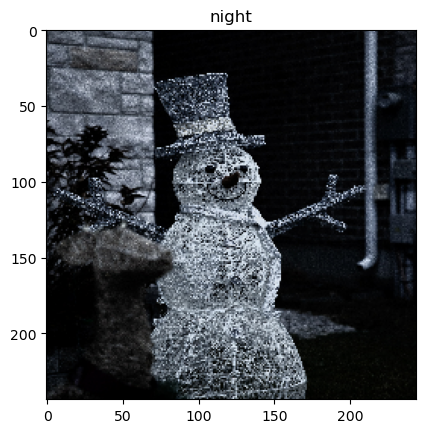

1/1 [==============================] - 0s 10ms/step


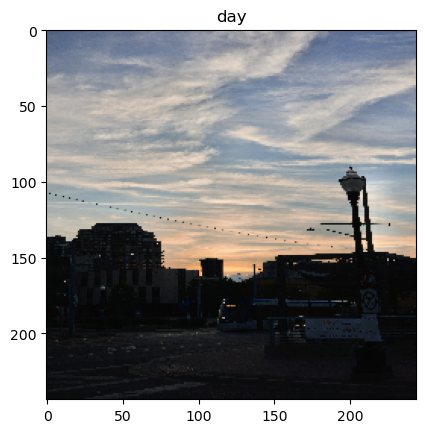

1/1 [==============================] - 0s 9ms/step


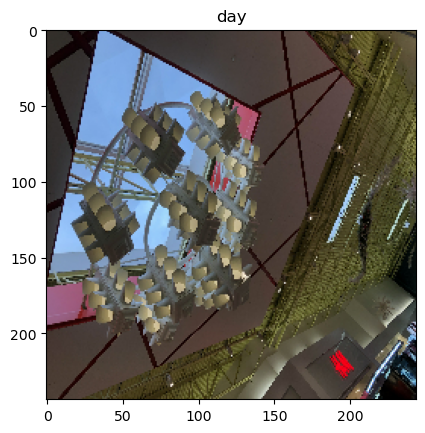

1/1 [==============================] - 0s 9ms/step


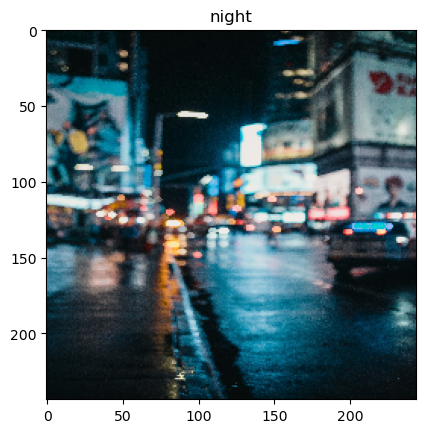

1/1 [==============================] - 0s 9ms/step


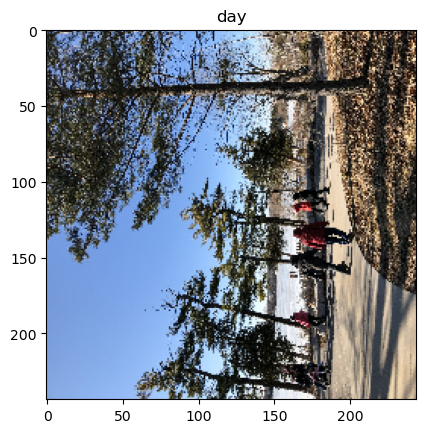

1/1 [==============================] - 0s 8ms/step


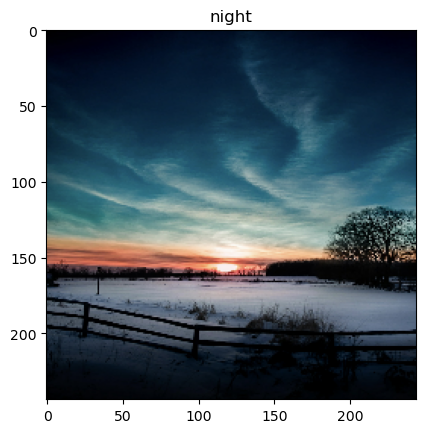

1/1 [==============================] - 0s 8ms/step


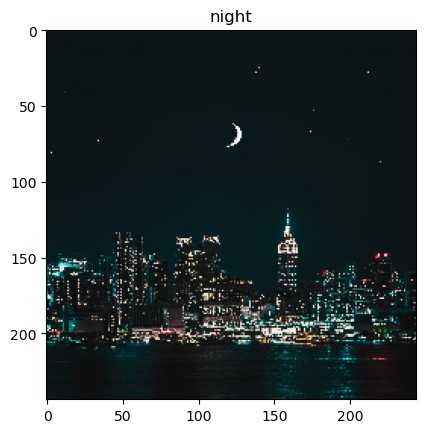

1/1 [==============================] - 0s 10ms/step


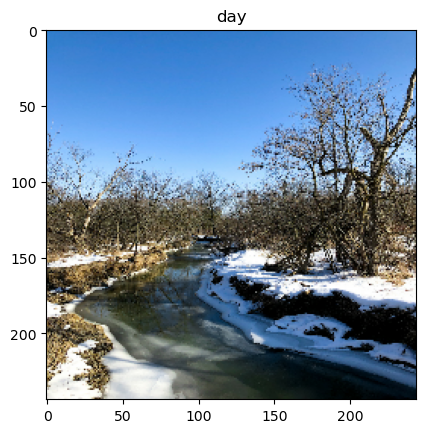

1/1 [==============================] - 0s 8ms/step


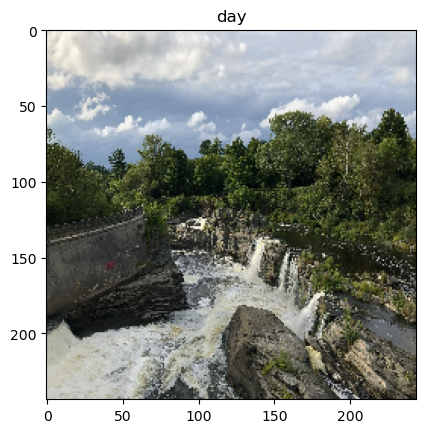

1/1 [==============================] - 0s 10ms/step


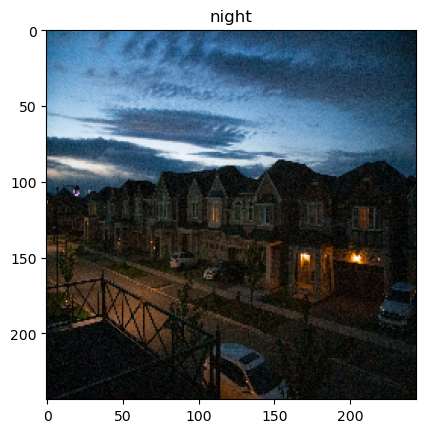

1/1 [==============================] - 0s 9ms/step


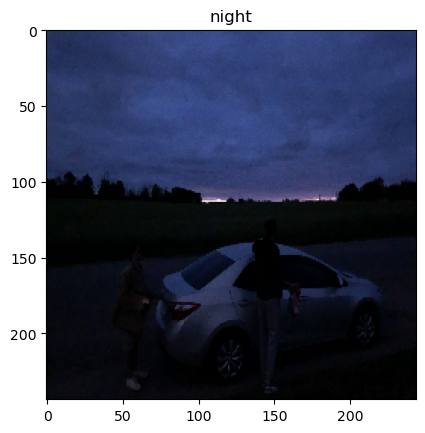

1/1 [==============================] - 0s 9ms/step


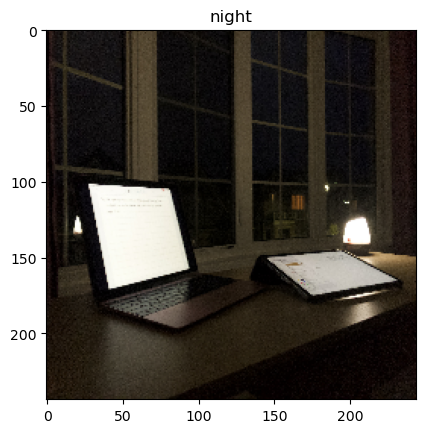

1/1 [==============================] - 0s 10ms/step


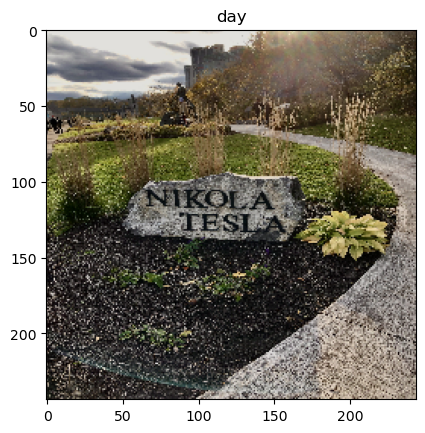

1/1 [==============================] - 0s 10ms/step


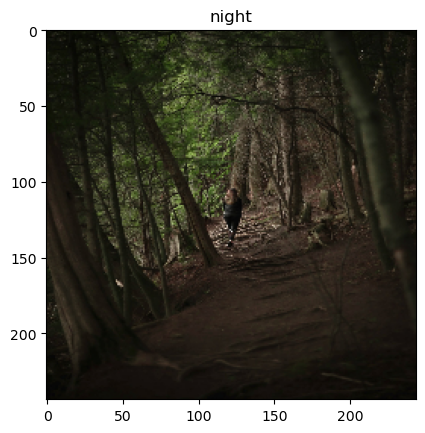

1/1 [==============================] - 0s 9ms/step


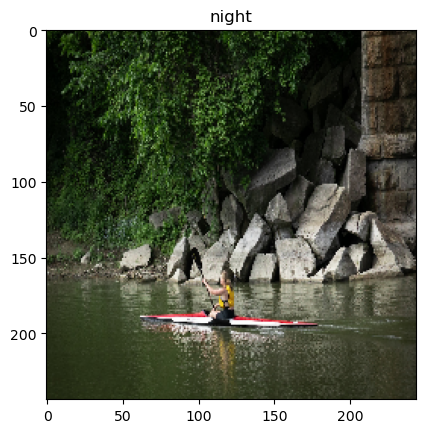

1/1 [==============================] - 0s 10ms/step


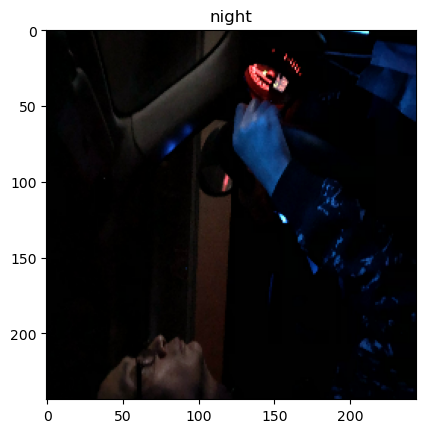

1/1 [==============================] - 0s 10ms/step


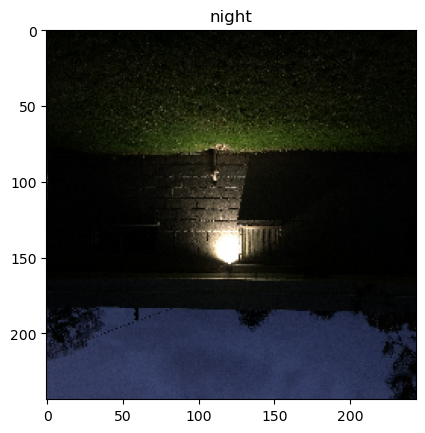

1/1 [==============================] - 0s 8ms/step


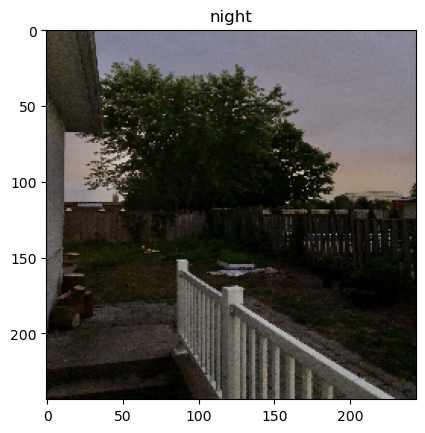

1/1 [==============================] - 0s 9ms/step


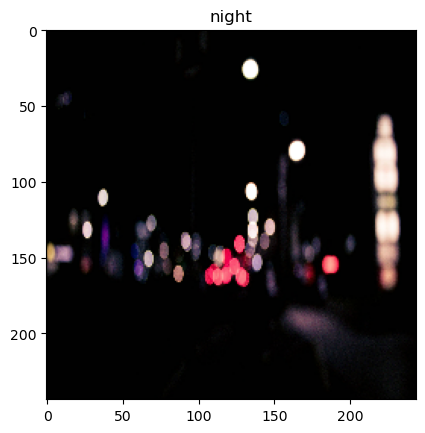

1/1 [==============================] - 0s 9ms/step


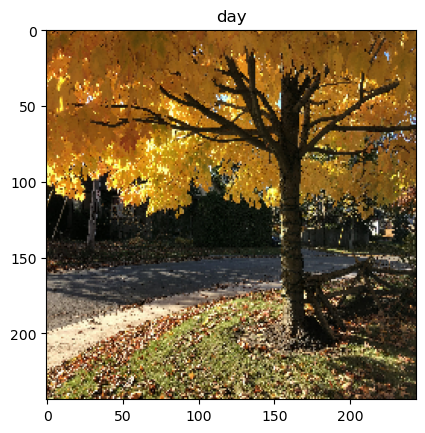

1/1 [==============================] - 0s 9ms/step


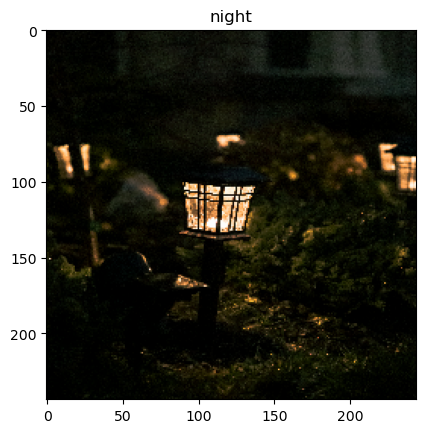

slice index 32 of dimension 0 out of bounds. [Op:StridedSlice] name: strided_slice/
slice index 33 of dimension 0 out of bounds. [Op:StridedSlice] name: strided_slice/
slice index 34 of dimension 0 out of bounds. [Op:StridedSlice] name: strided_slice/
slice index 35 of dimension 0 out of bounds. [Op:StridedSlice] name: strided_slice/
slice index 36 of dimension 0 out of bounds. [Op:StridedSlice] name: strided_slice/
slice index 37 of dimension 0 out of bounds. [Op:StridedSlice] name: strided_slice/
slice index 38 of dimension 0 out of bounds. [Op:StridedSlice] name: strided_slice/
slice index 39 of dimension 0 out of bounds. [Op:StridedSlice] name: strided_slice/
slice index 40 of dimension 0 out of bounds. [Op:StridedSlice] name: strided_slice/
slice index 41 of dimension 0 out of bounds. [Op:StridedSlice] name: strided_slice/
slice index 42 of dimension 0 out of bounds. [Op:StridedSlice] name: strided_slice/
slice index 43 of dimension 0 out of bounds. [Op:StridedSlice] name: strided

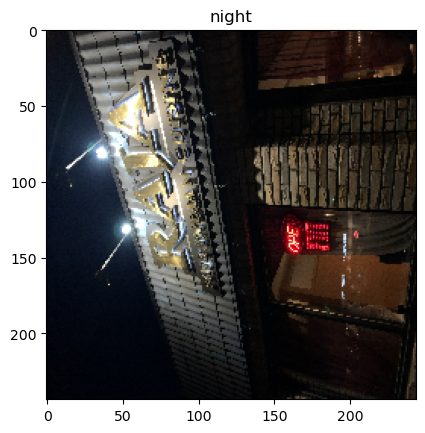

1/1 [==============================] - 0s 9ms/step


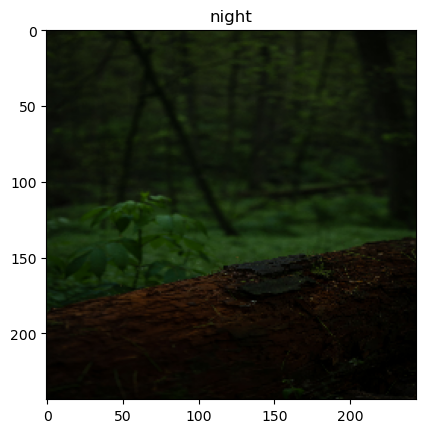

1/1 [==============================] - 0s 9ms/step


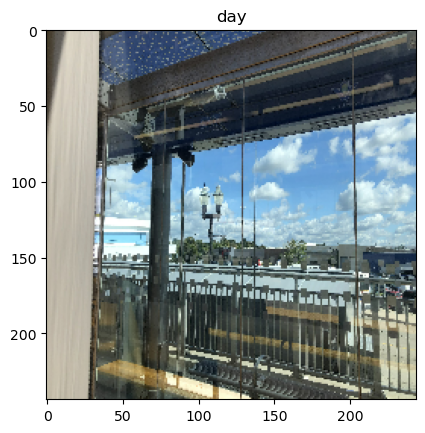

1/1 [==============================] - 0s 9ms/step


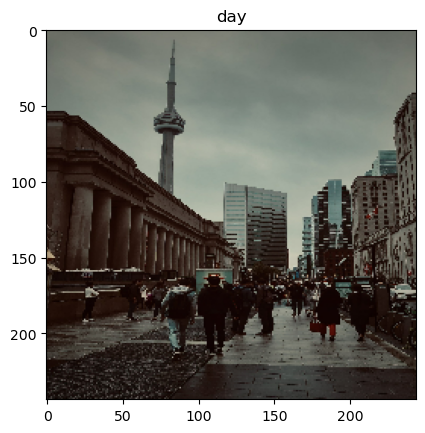

1/1 [==============================] - 0s 8ms/step


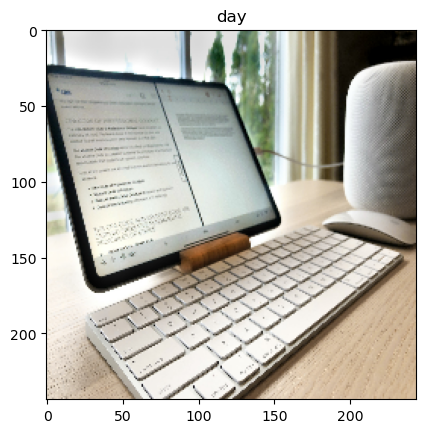

1/1 [==============================] - 0s 9ms/step


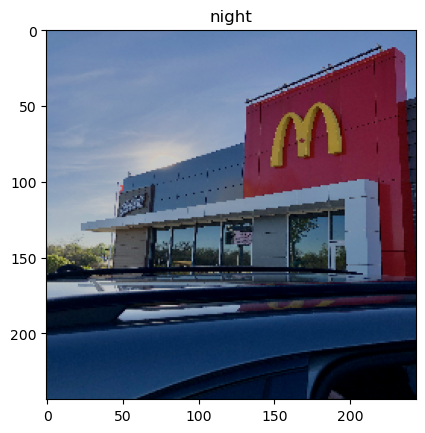

1/1 [==============================] - 0s 9ms/step


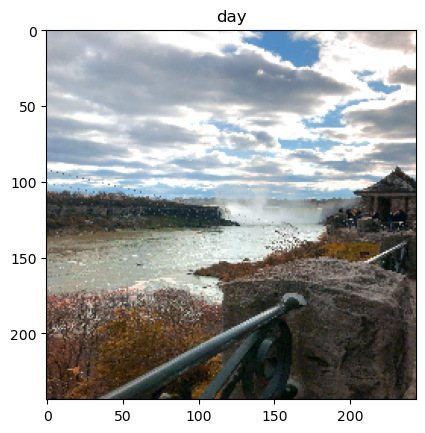

1/1 [==============================] - 0s 9ms/step


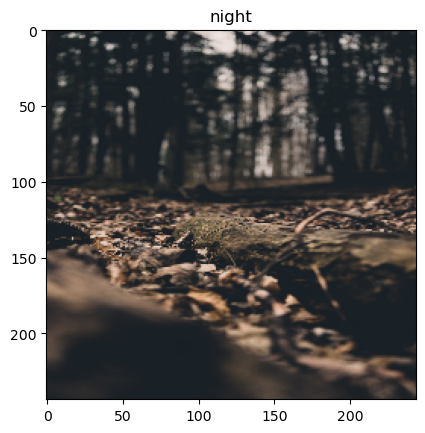

1/1 [==============================] - 0s 9ms/step


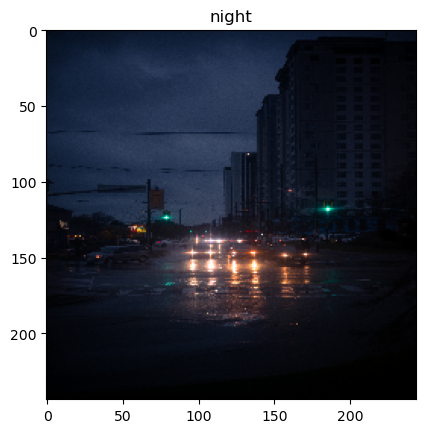

1/1 [==============================] - 0s 9ms/step


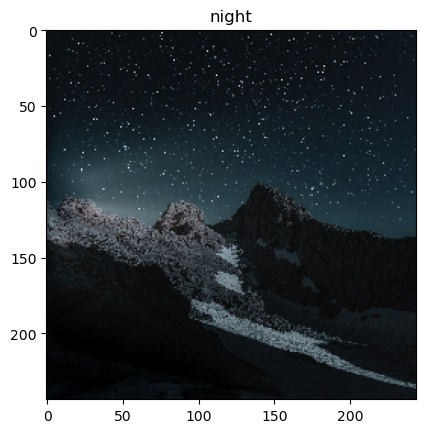

1/1 [==============================] - 0s 9ms/step


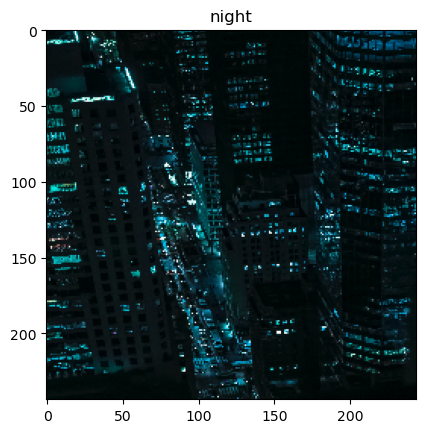

1/1 [==============================] - 0s 10ms/step


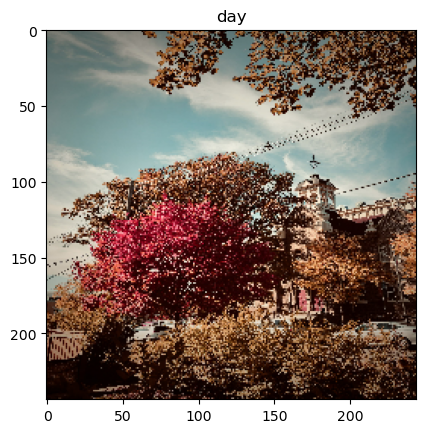

1/1 [==============================] - 0s 9ms/step


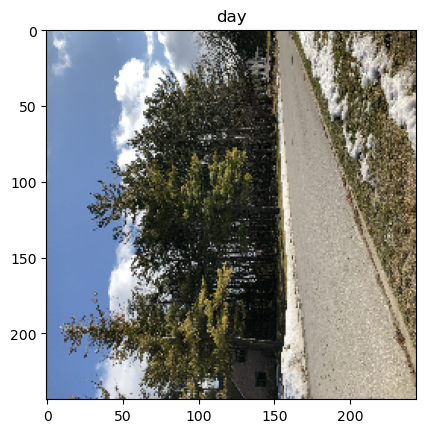

1/1 [==============================] - 0s 9ms/step


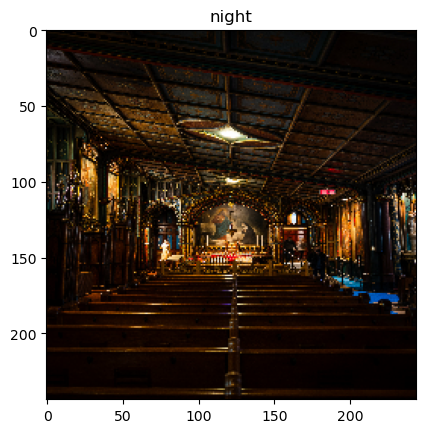

slice index 14 of dimension 0 out of bounds. [Op:StridedSlice] name: strided_slice/
slice index 15 of dimension 0 out of bounds. [Op:StridedSlice] name: strided_slice/
slice index 16 of dimension 0 out of bounds. [Op:StridedSlice] name: strided_slice/
slice index 17 of dimension 0 out of bounds. [Op:StridedSlice] name: strided_slice/
slice index 18 of dimension 0 out of bounds. [Op:StridedSlice] name: strided_slice/
slice index 19 of dimension 0 out of bounds. [Op:StridedSlice] name: strided_slice/
slice index 20 of dimension 0 out of bounds. [Op:StridedSlice] name: strided_slice/
slice index 21 of dimension 0 out of bounds. [Op:StridedSlice] name: strided_slice/
slice index 22 of dimension 0 out of bounds. [Op:StridedSlice] name: strided_slice/
slice index 23 of dimension 0 out of bounds. [Op:StridedSlice] name: strided_slice/
slice index 24 of dimension 0 out of bounds. [Op:StridedSlice] name: strided_slice/
slice index 25 of dimension 0 out of bounds. [Op:StridedSlice] name: strided

In [16]:
for images in ds_testing:
    for i in range(46):
        try:
            image = images[i]
            plt.imshow(image.numpy().astype("uint8"))
            predictions = model.predict(np.expand_dims(image, axis=0))
            plt.title(get_prediction(predictions, class_names))
            plt.show()
        except Exception as e:
            print(e)